# Sea ice segmentation: adaptive thresholding
This method uses a sequence of watershed function applications and morphological operations to identify segments. It starts from the tiled binarized ice mask (which is just calling AdaptiveThreshold()).

The goal is to create an AbstractSegmentationAlgorithm that takes the morphological residue and (optionally) the number of tiles as an input, then produces a SegmentedImage object.

1. Adaptive threshold binarization
2. Morphological cleanup
3. For distances ranges (max, med), (med, small), (small, smallest):
   1. Find markers (distance threshold, erosion)
   2. Watershed application
   3. Filter results based on circularity
   4. Remove floes from image
4. Merge the three floe sizes.






In [1]:
using Pkg
# Specifying an environment makes it easier to work with package versions
Pkg.activate("calval")

using IceFloeTracker
using Images
using Random
using DataFrames
using CSV
using Plots
using StatsBase


  Activating project at `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval`


In [2]:
function _SegmentedImage(image, image_indexmap)
    """Literally just what is in the ImageSegmentation library, I don't know why it
    doesn't work out of the box."""
    _segment_labels = Set(image_indexmap)
    _segment_labels = collect(_segment_labels)
    _segment_means = Dict{Int,float64(RGB)}()
    _segment_pixel_count = Dict{Int,Int}()
    
    for i in _segment_labels
        _segment_means[i] = zero(float64(RGB))
        _segment_pixel_count[i] = 0
    end
    
    for p in eachindex(image, image_indexmap)
        label = image_indexmap[p]
        _segment_means[label] += image[p]
        _segment_pixel_count[label] += 1
    end
    for i in _segment_labels
        _segment_means[i] /= _segment_pixel_count[i]
    end
    
    return SegmentedImage(image_indexmap, _segment_labels, _segment_means, _segment_pixel_count)
end

_SegmentedImage (generic function with 1 method)

In [3]:
"""Utility functions for viewing segmentation results"""
# Return a random color of type RGB{N0f8}
function get_random_color(seed)
    Random.seed!(seed)
    rand(RGB{N0f8})
end

# Produce an image by replacing values inside a segment with the segment mean color
function view_seg(s)
    map(i->segment_mean(s,i), labels_map(s))
end

# Assign random colors to each segment (useful if viewing cluster results)
function view_seg_random(s)
    map(i->get_random_color(i), labels_map(s))
end



view_seg_random (generic function with 1 method)

In [4]:
# Parameters
cloud_mask_settings = (
    prelim_threshold=53.0/255.,
    band_7_threshold=130.0/255.,
    band_2_threshold=169.0/255.,
    ratio_lower=0.0,
    ratio_upper=0.53
)

ice_masks_params = (
    band_7_threshold=5,
    band_2_threshold=230,
    band_1_threshold=240,
    band_7_threshold_relaxed=10,
    band_1_threshold_relaxed=190,
    possible_ice_threshold=75,
    k=4, # number of clusters for kmeans segmentation
    factor=255, # normalization factor to convert images to uint8
)

prelim_icemask_params = (radius=10, amount=2, factor=0.5)


(radius = 10, amount = 2, factor = 0.5)

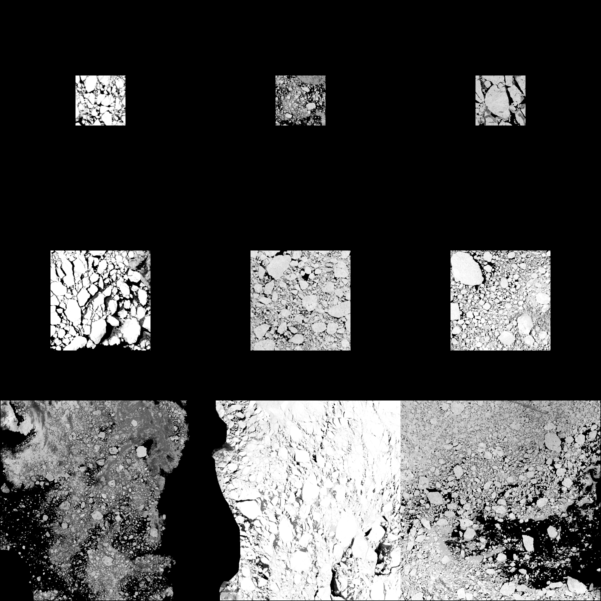

In [5]:
##### Example images are from the package folder
use_example_images = true
if use_example_images

    # Location of the test images
    test_dir = joinpath("/Users/dwatkin2/Documents/research/packages/IceFloeTracker.jl/", "test")

    # Available test cases. Only showing Aqua truecolor for brevity. Each case has Aqua, Terra and has truecolor, falsecolor, and landmasks.
    example_loc = joinpath(test_dir, "test_inputs/preprocessing_workflows/")
    
    # Rearranged order just to make the figure prettier:
    case_names = ["sea_of_okhostk-50km-20180412", "barents_kara_seas-100km-20250507",  "baffin_bay-200km-20060704", 
        "greenland_sea-50km-20180712", "east_siberian_sea-100km-20190612",  "bering_chukchi_seas-200km-20210314", 
        "beaufort_sea-50km-20070614", "hudson_bay-100km-20060513",  "laptev_sea-200km-20230613"]
    
    # View the morphological residue files
    file_names = [split(c, "-")[3]*".250m.aqua.morphed_residue.tiff" for c in case_names]
    Images.mosaicview([RGB.(load(joinpath(example_loc, case, file)))
            for (case, file) in zip(case_names, file_names)], ncol=3)
end

east_siberian_sea-100km-20190612

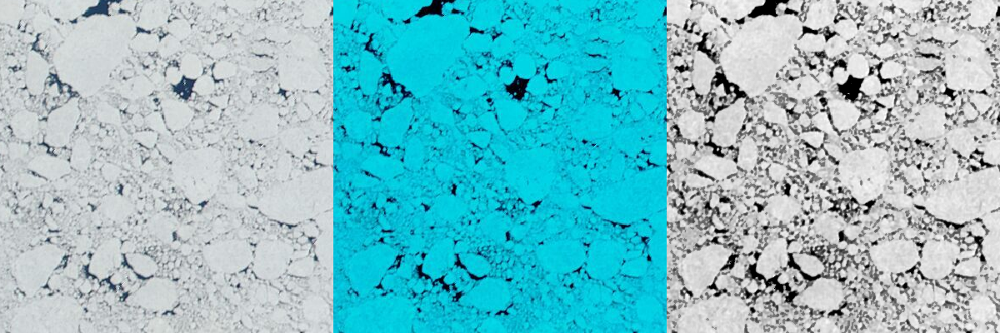

In [210]:
if use_example_images
    case = "east_siberian_sea-100km-20190612"
    print(case)
    date = split(case, "-")[3]
    satellite = "aqua"
    
    lm_image = float64.(RGB.(load(joinpath(example_loc, case, join([date, "250m", satellite, "landmask.tiff"], ".")))))
    fc_image = float64.(RGB.(load(joinpath(example_loc, case, join([date, "250m", satellite, "falsecolor.tiff"], ".")))))
    tc_image = float64.(RGB.(load(joinpath(example_loc, case, join([date, "250m", satellite, "truecolor.tiff"], ".")))))
    morphed_image = float64.(Gray.(load(joinpath(example_loc, case, join([date, "250m", satellite, "morphed_residue.tiff"], ".")))))
    morphed_image_int = Array(Int64.(morphed_image .* 255))
end
Images.mosaicview(tc_image, fc_image, morphed_image, nrow=1)

The Laptev Sea case image is a motivating example. The morphological residue appears to do a good job of making ice floes easily visible to the naked eye. However, the ice floes are not all the same color. So we expect that some objects will come out clearly here, while others may be harder to discern.

## Example case by row

In [211]:
cloudmask = IceFloeTracker.create_cloudmask(fc_image; cloud_mask_settings...)
fc_img_cloudmasked = IceFloeTracker.apply_cloudmask(fc_image, cloudmask)
landmask = IceFloeTracker.create_landmask(lm_image)

(dilated = Bool[1 1 … 1 1; 1 1 … 1 1; … ; 1 1 … 1 1; 1 1 … 1 1], non_dilated = Bool[1 1 … 1 1; 1 1 … 1 1; … ; 1 1 … 1 1; 1 1 … 1 1])

The default settings result in some floes being detected, primarily in the bottom half of the image. The binarized tiling does seem to have more of the identifiable floes than the k-means (prelim_icemask) result. Let's first see what information is in the k-means result.

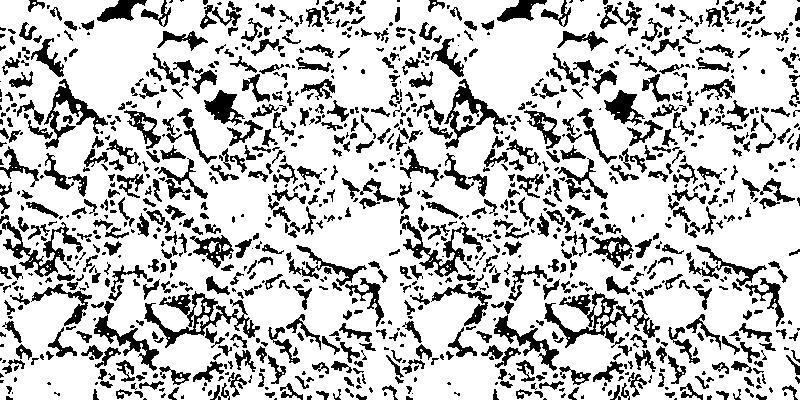

In [212]:
ntiles = 2
prelim_sizes = size(tc_image) .÷ ntiles
tiles = IceFloeTracker.get_tiles(tc_image, prelim_sizes[1] + 1)

binarized_image_full = IceFloeTracker.imbinarize(morphed_image)
binarized_tiled = zeros(size(binarized_image_full))
for tile in tiles
    binarized_tiled[tile...] = IceFloeTracker.imbinarize(morphed_image[tile...])
end
Images.mosaicview(binarized_image_full, binarized_tiled, nrow=1)

# What happens in the PreprocessTiling algorithm
1. binarized_tiled created in the get_ice_masks() function
2. sent to get_segment_masks
   1. `fillholes!`
       1. `idx = get_holes(img, min_opening_area=20, se=IceFloeTracker.se_disk4()`
            1. `ImageMorphology.area_opening)`
            2. `IceFloeTracker.hbreak!`
            3. `IceFloeTracker.branch`
            4. `IceFloeTracker.bridge`
            5. `IceFloeTracker.opening`
            6. `out = fill_holes`
            7. return `out != img`
       2. img[get_holes] .= true
    2. `watershed1`
3. Find the places where the boundaries of the watershed1 results for the binarized tiled image match the other image.

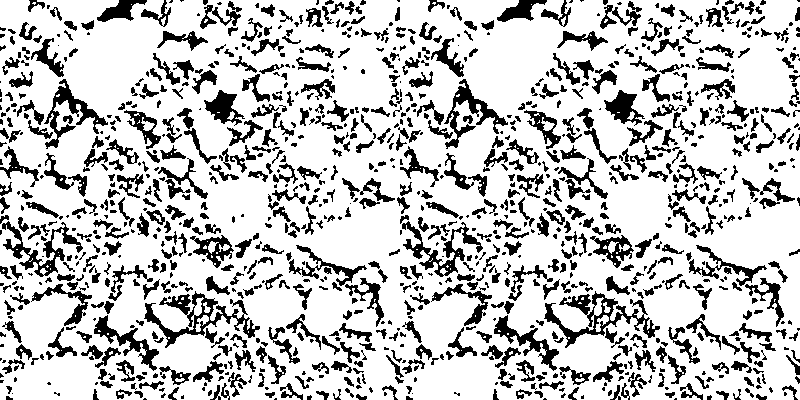

In [213]:
bin_tiled = binarized_tiled .> 0
IceFloeTracker.fillholes!(bin_tiled);
Images.mosaicview(Gray.(binarized_tiled), Gray.(bin_tiled), nrow=1)

In [214]:
tc_seg = _SegmentedImage(tc_image, label_components(bin_tiled));
bin_tiled2 = deepcopy(bin_tiled) .> 0
IceFloeTracker.fillholes!(bin_tiled2)
tc_seg2 = _SegmentedImage(tc_image, label_components(bin_tiled2));

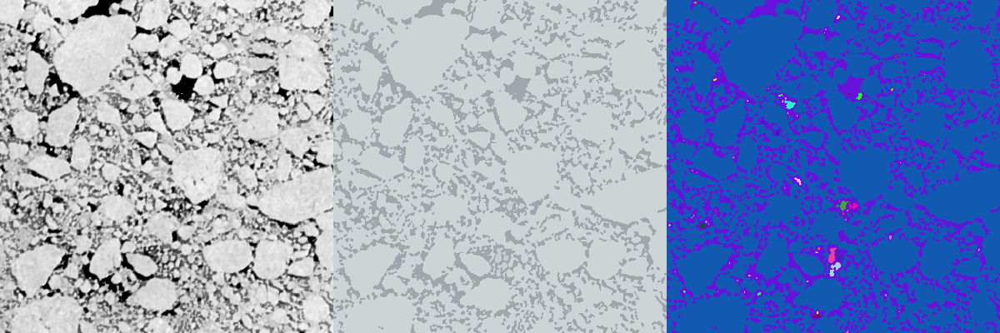

In [215]:
Images.mosaicview([morphed_image, view_seg(tc_seg), view_seg_random(tc_seg)], nrow=1)

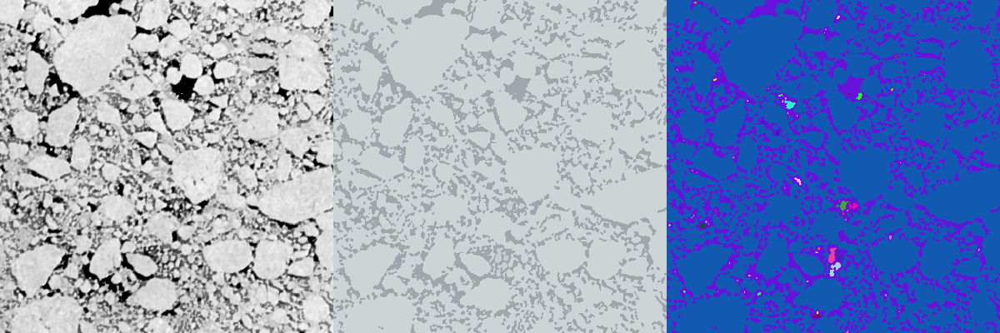

In [216]:
Images.mosaicview([morphed_image, view_seg(tc_seg2), view_seg_random(tc_seg2)], nrow=1)

Application of the watershed algorithm to the binarized image
* TBD: check that this is what happens in the IFT algorithm
* TBD: Examine what the imextendedmin, impose_minima functions are doing
* Look at the example with the oreos to see how the random colors should work

Can I make the watershed function have a cleaner result by being careful about the distances? What distance thresholds are being used here?

What I'm seeing:
- The original watershed1 function has mainly the right parts, but the methods for finding the extended minima and impose minima etc produce low-quality results, and the selection of segment borders, rather than segments, results in enforced minimum distances between ice floes.
- What we can do instead is to keep most of the function, but use erosion


In [251]:

# im1 = deepcopy(Images.dilate(Images.dilate(Images.erode(Images.erode(binarized_tiled)))) .> 0)
im1 = binarized_tiled .== 0
IceFloeTracker.fillholes!(im1)
im1 = .!im1

seg = -IceFloeTracker.bwdist(.!im1)
mask2 = IceFloeTracker.imextendedmin(seg);
seg2 = IceFloeTracker.impose_minima(seg, mask2);
cc = label_components(IceFloeTracker.imregionalmin(seg2), trues(3, 3))

cc = label_components(Images.erode(seg .< -4))
w = watershed(im2, cc)
lmap2 = labels_map(w)
# Multiply by the original binary image, as is done in the ImageSegmentation example
lmap_seg2 = _SegmentedImage(fc_image, lmap2 .* (im2))

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 196

In [265]:
im1 = binarized_tiled .> 0
idx = IceFloeTracker.get_holes(im1, 10, IceFloeTracker.se_disk4())
im1[idx] .= true

Base.Broadcast.BitMaskedBitArray{2, 2}(Bool[1 1 … 0 0; 1 1 … 0 0; … ; 1 1 … 1 1; 1 1 … 1 1], Bool[1 1 … 0 0; 1 1 … 0 0; … ; 1 1 … 1 1; 1 1 … 1 1])

In the watershed1 function, the morphological operations are 
* area opening
* branch
* bridge
* opening
* fill_holes (from the next version of ImageMorphology)

In [280]:
using ImageMorphology

area_opening(im1)

400×400 BitMatrix:
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  1  1  1  1  1  1  1  1  1  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     1  1  1  1  1  1  1  1  1  1  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     1  1  1  1  1  1  1  1  1  1  1  1
 1  1  1  1  1  1  1  1  1  1  1  1  1     1  1  1  1  1  1  1  1  1  1  1  1
 1  1  1  1  1  1  1  1  1  1  1  1  1     1  1  1  1  1  1  1  1  1  1  1  1
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  1  1  1  1  1  1  1  1  1  1  1  1
 1  1  1  1  1  1  1  1  1  1  1  1  1     1  1  1  1  1  1  1  1  1  1  1  1
 1  1  1  1  1  1  1  1  1  1  1  1  1     1  1  1  1  1  1  1  1  1  1  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     1  1  1  1  1  1  1  1  1  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     1  1  1  1  1  1  1  1  1  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  1  1  1  1  1  1  1  1  1  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     1  1  1  1  1  1  1  1  1  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     1 

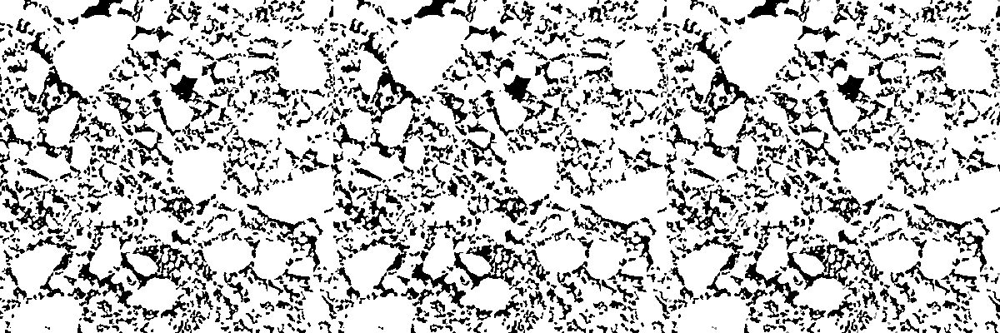

In [299]:
Images.mosaicview(Gray.(im1), Gray.(area_opening(im1, min_area=10)), 0.5 .* Gray.(im1) .+ 0.5 .* Gray.(area_closing(im1, min_area=10)), nrow=1)
    # Gray.(IceFloeTracker.branch(im1)), Gray.(IceFloeTracker.branchbridge(im1)), nrow=2)

# , tc_image, Gray.(Images.erode(seg .< -4)),
#      view_seg_random(lmap_seg2) .* im2, Gray.(tc_image), nrow=2, order="C")

From here, we can use some geometric filters (if wanted) to select the likely ice floes.


In [220]:
# We can use the region props table to filter the segment results
rpt = IceFloeTracker.regionprops_table(lmap_seg2.image_indexmap, properties=["area", "perimeter", "label"])
rpt[!, :circularity] = 4 * π .* rpt[!, :area] ./ rpt[!, :perimeter].^2;

In [221]:
keep_labels = rpt[(rpt.circularity .> 0.4 .&& rpt.circularity .<= 1.1) .&& rpt.area .> 16, :label];

In [239]:
new_index = zeros(Int64, size(im2))
for label in keep_labels
    new_index[lmap_seg2.image_indexmap .== label] .= label
end

In [240]:
filtered_segments = _SegmentedImage(fc_image, new_index)

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 139

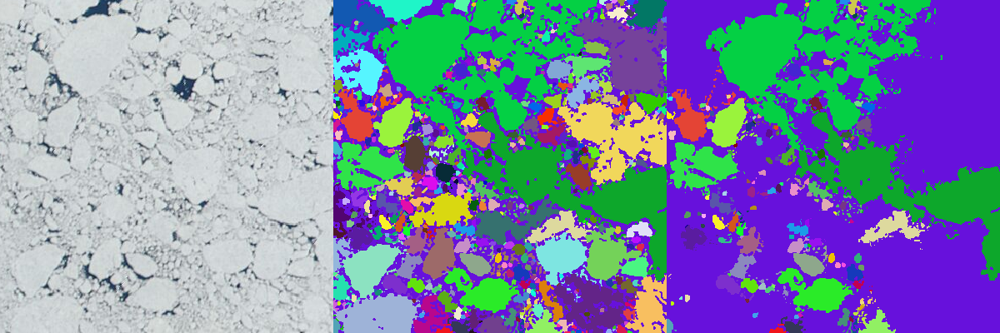

In [242]:
Images.mosaicview(tc_image, view_seg_random(lmap_seg2), view_seg_random(filtered_segments), nrow=1)

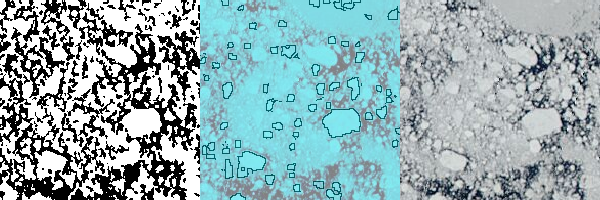

In [204]:
im2 = filtered_segments.image_indexmap .> 0
im3 = deepcopy(binarized_tiled)
im3[Images.dilate(im2) .> 0] .= 0
Images.mosaicview(binarized_tiled, 0.5 .* fc_image .+ 0.5 .* ( 1 .- Gray.(im2 .- Images.erode(im2))),
    tc_image, nrow=1)

In [75]:
function color_magnitude(c)
    sqrt(float64(a.r)^2 + float64(a.b)^2 + float64(c.g)^2)
end
color_magnitude(a - b)

0.97053079647826

In [79]:
min_area = 16
rem_labels = [s for s in fc_seg.segment_labels if fc_seg.segment_pixel_count[s] <= min_area]
diff_fn(rem_label, neigh_label) = color_magnitude(segment_mean(fc_seg, rem_label) - segment_mean(fc_seg, neigh_label));
pruned_image = ImageSegmentation.prune_segments(fc_seg, rem_labels, diff_fn)

Segmented Image with:
  labels map: 800×800 Matrix{Int64}
  number of labels: 11007

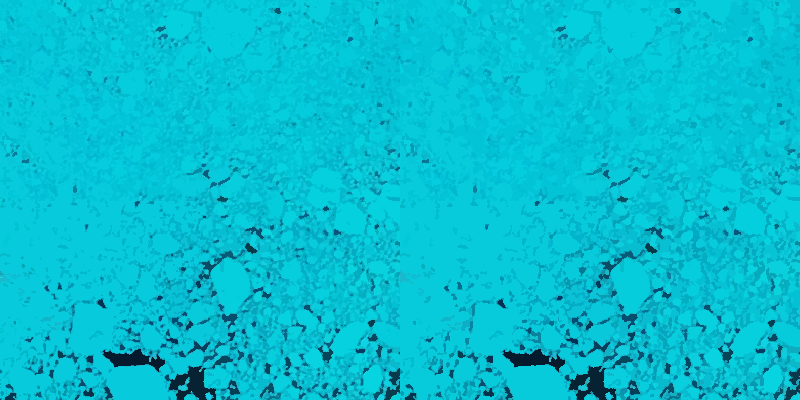

In [87]:
zoom = (1:400, 1:400)
Images.mosaicview(view_seg(fc_seg)[zoom...], view_seg(pruned_image)[zoom...], nrow=1)

# Quality of the prelim icemask and binarized tiling
We can measure the performance of the default settings for the ice-mask and binarized tiling performance by computing the precision and recall, overall and object-by-object. For each image with at most 20% cloud cover, compute the prelim icemask and binarized tiling. Then, we can measure the performance directly as the percent agreement weighted by the number of true floe pixels and by the number of detected ice pixels.

In [997]:
man_labels = channelview(lb_image)[1,:,:] .> 0;

In [105]:
Images.mosaicview(Gray.(man_labels), Gray.(prelim_icemask), Gray.(binarized_tiling), nrow=1)

LoadError: UndefVarError: `man_labels` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [999]:
n_true = sum(man_labels)
n_pred = sum(prelim_icemask)
n_intersect = sum(man_labels .&& prelim_icemask)
P = n_intersect/n_pred
R = n_intersect/n_true
print(P, " ", R)

0.48324608721069273 0.942572820565979

Notes from looking at the 9 example cases. 

For the Beaufort Sea case, the result was okay but not ideal. For the Barents-Kara seas case, it worked really well with small tiles (one artifact).

Let's break down what has happened in this image so far. 
1. The image was broken into tiles, first. Here I've used 1-8 tiles, it's not clear what the ideal size is. Using 1 looks good usually, using 8 results in the bug where the prelim icemask flips some landmask pixels.
2. Then, the FC image, the morphological residue, the dilated landmask, etc were sent to the function `get_ice_masks()`, which is in the file `ice_masks.jl`.
3. Inside the `get_ice_masks` function, the following major steps occur on each tile:
   1. `kmeans_segmentation` with k=3 is applied to the morphological residue. Note here that the morphological residue is an integer matrix in the image input, then is transformed to Grayscale for kmeans segmentation. So the cast to integer may be unneeded.
   2. `get_nlabel` is called on the FC and the segmentation result to choose a single k-means cluster for sea ice
   3. Only this cluster is set to "True"
   4. Optionally, the imbinarize algorithm is also called on the adjusted morphological resiude.

# K-means segmentation
The function `kmeans_segmentation` is housed within the `segmentation_a_direct.jl` file. There are two methods:
1. `kmeans_segmentation(gray_image=Matrix{Gray{Float64}}, ice_labels=Vector{Int64}, k=4, max_iter=50`)
2. `kmeans_segmentation(gray_image=Matrix{Gray{Float64}}, k=4, maxiter=50)`
The K-means segmentation result divides the image into 4 classes. The IFT function attempts to make a binary mask based on the output of the K-means segmentation. So we ask the questions
- Do we typically see only one cluster representing all floes?

In [1021]:
segments = zeros(size(morphed_im_int))
for tile in tiles
    segments[tile...] = IceFloeTracker.kmeans_segmentation(morphed_image[tile...], k=4)
end

nmode = StatsBase.mode(segments[man_labels])
round(StatsBase.mean(segments[man_labels] .== nmode), sigdigits=2)

0.94

In [1022]:
for label in man_labeled.segment_labels
    idx = man_labeled.image_indexmap .== label
    n = man_labeled.segment_pixel_count[label]
    break
end

In [1023]:
man_labeled = _SegmentedImage(fc_image, label_components(lb_image))
fc_segments_k4 = _SegmentedImage(fc_image, Int64.(segments))
fc_segments = _SegmentedImage(fc_image, label_components(segments))

# Application of simple filter to assign all segments with area
# less than 1 km2 to a single class (label=0). 

min_area = 16
function size_filter(s, seg)
    seg.segment_pixel_count[s] > min_area && return s
    return 0
end

test = _SegmentedImage(fc_image, map(i->size_filter(i, fc_segments), labels_map(fc_segments)))

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 470

Top: True color image, True color manual label means
Bottom: Morphological residue, False color segment means

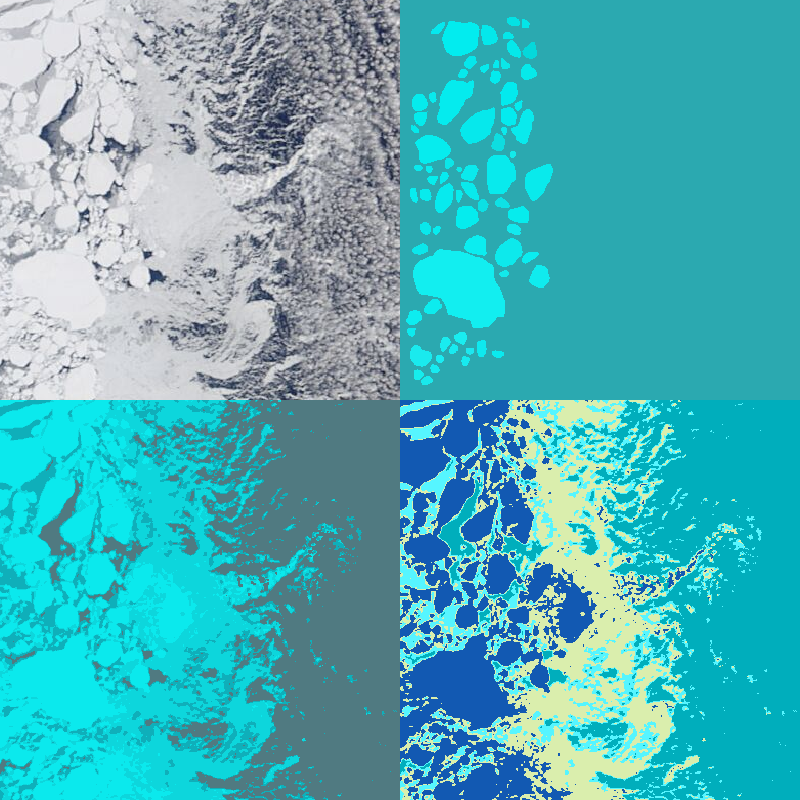

In [1024]:
print("Top: True color image, True color manual label means\n")
print("Bottom: Morphological residue, False color segment means")
Images.mosaicview(tc_image, view_seg(fc_segments_k4), # .* man_labels,
            view_seg(man_labeled), view_seg_random(fc_segments_k4), nrow=2)

* Boundary pixels often get added to a second category. Is it possible to find these edge pixes without dropping the rest?
* Multiplying by the traced shapes lets us see the number of ice floes given to a different category.

As a note, the segment means provide a convenient way to lookup the type classification for image regions for the sea ice label identification. 

What I'm seeing from this example is that the k-means result is actually doing really well at separating out the sea ice floes that we might be able to track from the background. We could enforce the minimum size here as a way to filter out the background from the ice floes. Later steps will help separate out the large floes.

There are methods for segment pruning, and segment merging that we can apply.

The next step is to see how the series of `get_ice_labels...` functions work (and whether they work).

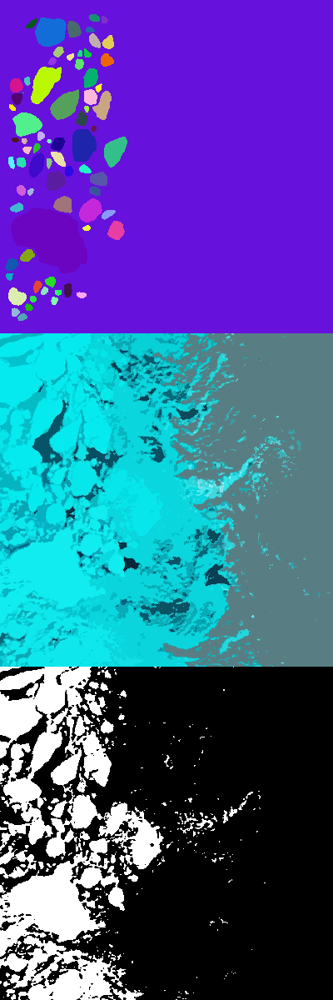

In [1025]:
zoom = (1:400, 1:400)
Images.mosaicview(view_seg_random(man_labeled)[zoom...], view_seg(fc_segments)[zoom...], Gray.(prelim_icemask)[zoom...],
    nrow=3)

Here's what's happening inside the tilewise floe labeling section.
1. Get the segment labels for that tile
2. Call the get_nlabel function, with the fc image, morphological residue, a "factor" to convert back to integers, and the 6 thresholds.
   1. Set the initial mask to pixels with $B_7 < 5$, $B_2 > 230$, and $B_1 > 240$.
   2. If any pixels satisfy all three, then select the k-means cluster with the most flagged pixels (Mode).
   3. Else, check if any pixels have $B_7 < 10$, $B_2 > 230$, and $B_1 > 190$.
   4. If any pixels satisfy all three, then select the k-means cluster with the most flagged pixels (Mode).
   5. Else, try the `get_nlabel_relaxation` function.
3. The `get_nlabel_relaxation` function starts by finding the image peaks for band 1 and band 2.
   1. If no peaks, return 1 !! This is a problem, because it allows non-floes and non-ice to be selected. It's okay to find nothing!
   2. Otherwise, use the identified peaks as thresholds for the same check as in step 2.1 and 2.3. !! Also a problem, because using the peak of the histogram results in losing data above the peak.
   3. If any are found, then return the mode.
   4. If none are found, then select just the ones that exceed the original band 2 threhold.
   5. If none are found, return 1.

I don't think that this threshold guess-and-check back-and-forth method is what we want to do. Really, the question is whether the object should be included in the binary floe mask image that will be sent to the morphological and watershed algorithms. It has the potential to provide bad data in many scenarios. 

What I'm thinking is that we need a more straightforward selection mechanism that separates the noisy background from the trackable floes. We can use the validation dataset to look at the statistics of mean floe brightness and check using segmentation metrics whether the number of k-means clusters is appropriate. We can expect some clusters to contain landfast ice, some to contain clouds, and others to have various types of sea ice floes.

## Calibration updates
- Ice thresholds: we can test the accuracy of this original mask. Can we go straight to the peaks and find tie points? Can we enforce physically reasonable band reflectance?
## Function updates (notes)
- get_ice_labels_mask. We can get rid of "factor" and use thresholds that already are scaled to 0 to 1.
- Can we simplify the processing without degrading the results? I find the tangle of segmentation steps confusing.

In [1026]:
t0, t1, t2 = prelim_icemask_params
test = IceFloeTracker.get_ice_labels_mask(n0f8.(fc_image), (60, 100, 100), 255);

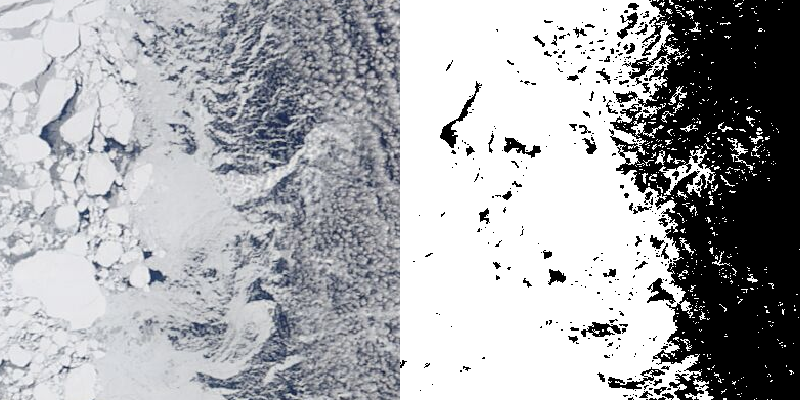

In [1027]:
Images.mosaicview(tc_image, Gray.(test), nrow=1)

In [1028]:
min_area = 16 # 1 km2
min_area = 64

# @time keep_segments = [x for x in keys(fc_seg.segment_pixel_count) if fc_seg.segment_pixel_count[x] >= min_area];

64

In [1029]:
# Application of simple filter to assign all segments with area
# less than 1 km2 to a single class (label=0). 
function size_filter(s, seg)
    seg.segment_pixel_count[s] > min_area && return s
    return 0
end

test = _SegmentedImage(fc_image, map(i->size_filter(i, fc_segments), labels_map(fc_segments)))

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 138

In [1030]:
# The segment means can then be used in a lookup table if needed, or some kind of plane partition.
segment_mean(test)

Dict{Int64, RGB{Float64}} with 138 entries:
  56   => RGB{Float64}(0.0577417,0.838945,0.855263)
  1703 => RGB{Float64}(0.0251377,0.91692,0.923111)
  1514 => RGB{Float64}(0.0195548,0.891468,0.902014)
  2616 => RGB{Float64}(0.290336,0.909629,0.928361)
  6    => RGB{Float64}(0.00694572,0.76092,0.809626)
  1419 => RGB{Float64}(0.0224395,0.905512,0.913231)
  2903 => RGB{Float64}(0.117342,0.485361,0.55435)
  45   => RGB{Float64}(0.020145,0.827182,0.866667)
  215  => RGB{Float64}(0.0406365,0.703723,0.744643)
  2324 => RGB{Float64}(0.0436735,0.663767,0.708472)
  846  => RGB{Float64}(0.0185897,0.686802,0.736765)
  2309 => RGB{Float64}(0.0687509,0.685836,0.717126)
  765  => RGB{Float64}(0.0252101,0.711373,0.770644)
  1695 => RGB{Float64}(0.0364672,0.652891,0.711312)
  262  => RGB{Float64}(0.0242128,0.650069,0.710032)
  865  => RGB{Float64}(0.0545944,0.848058,0.879892)
  2048 => RGB{Float64}(0.0317551,0.364323,0.444317)
  2079 => RGB{Float64}(0.0338049,0.670936,0.726185)
  567  => RGB{Float64}(0.

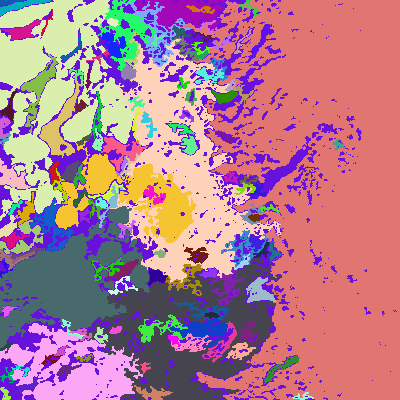

In [1031]:
rcolors = view_seg_random(test)
rcolors[zoom...]

In [1032]:
# rcolors[test.segment_labels == 0] .= RGB(0)

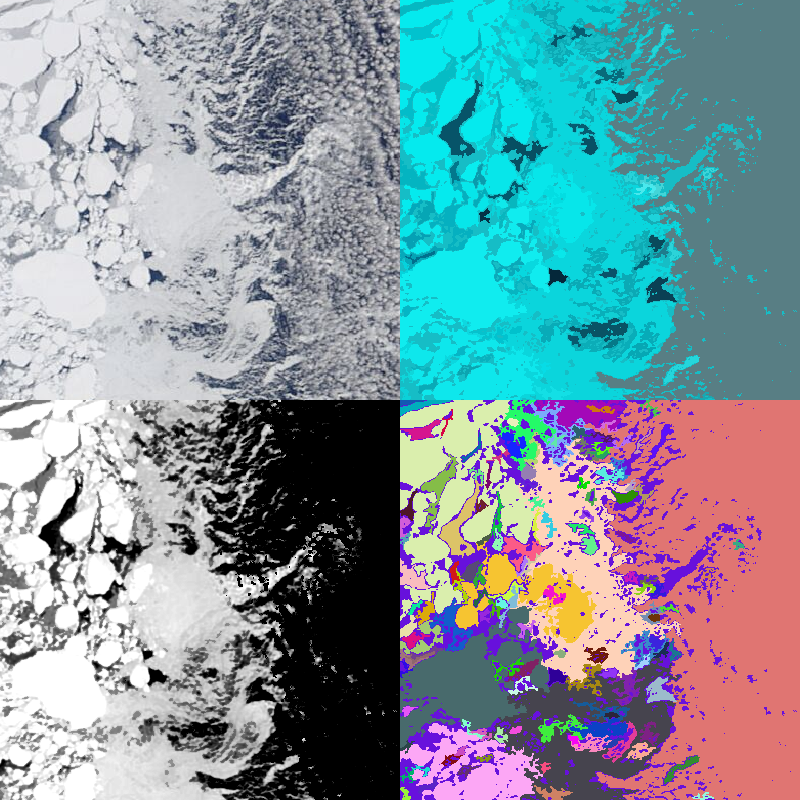

In [1033]:
Images.mosaicview(tc_image, morphed_image, view_seg(test), rcolors, nrow=2)

In [1034]:
sort(test.segment_pixel_count)

OrderedCollections.OrderedDict{Int64, Int64} with 138 entries:
  0   => 21366
  1   => 88
  2   => 274
  4   => 13094
  6   => 319
  10  => 177
  14  => 122
  15  => 70
  19  => 452
  39  => 193
  41  => 494
  42  => 142
  45  => 73
  47  => 9252
  50  => 70
  51  => 5543
  56  => 87
  59  => 80
  80  => 189
  85  => 79
  125 => 91
  161 => 77
  198 => 109
  215 => 69
  262 => 241
  ⋮   => ⋮

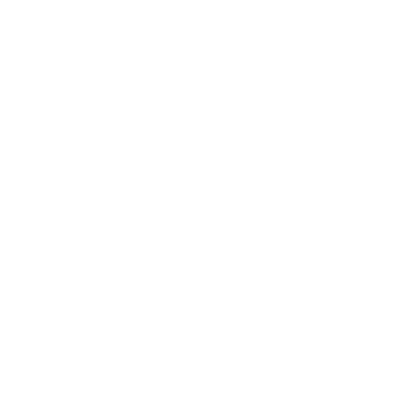

In [1035]:
bw = test.image_indexmap .!= 40
Images.mosaicview(Gray.(bw))

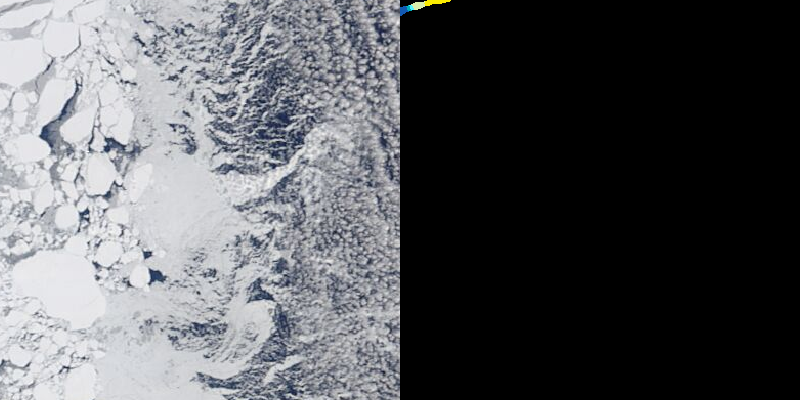

In [1036]:
using Images, ImageSegmentation

# img = load(download("http://docs.opencv.org/3.1.0/water_coins.jpg"));

# bw = Gray.(img) .> 0.5;

# dist = 1 .- distance_transform(feature_transform(bw));
bw = test.image_indexmap .!= 2
dist = 1 .- distance_transform(feature_transform(bw));
markers = label_components(dist .< -2);

wsegments = watershed(dist, markers)
Images.mosaicview(tc_image, map(i->get_random_color(i), labels_map(wsegments)) .* (1 .-bw), nrow=1)

# Watershed Segmentation of the Grayscale Image
"Ice floe segmentation is performed to minimize such identification errors by identifying intensity valleys and appplying a watershed semgmentation to each image. To this end, bordering ice-pixels are identified and connected via a awatershed function by calculating the inverse Euclidean distance of each ice-pixel to the nearest water-pixel, and recognizing that pixels within the center of the ice floes have larger absolute distances to water pixels than those at the contour. The watershed function is applied to both ice-water discriminated images and binary images that have already been processed via K-means color segmentation to reduce any artifacts due to incorrect segmentation."

segment_mask = ice_mask .&& tiled_binmask

```
function watershed1(bw::T) where {T<:Union{BitMatrix,AbstractMatrix{Bool}}}
    seg = -IceFloeTracker.bwdist(.!bw)
    mask2 = imextendedmin(seg)
    seg = impose_minima(seg, mask2)
    cc = label_components(imregionalmin(seg), trues(3, 3))
    w = ImageSegmentation.watershed(seg, cc)
    lmap = labels_map(w)
    return Images.isboundary(lmap) .> 0
end
```

The `watershed1` function operates on the binarized output of the K-means segmentation step. 
It uses a few `utils` functions that draw on Images and ImageSegmentation.

* `bwdist`: Wrapper for `Images.distance_transform(Images.feature_transform))`. Takes a boolean abstract array as an input. Location: `src/utils.jl`.
* `imextendedmin`: Wrapper for `ImageSegmentation.hmin_transform` and `Images.local_minima` with default depth threshold 2 and 8-neighborhood connectivity. Based on MATLAB's imextendedmin.
* `impose_minima`: Wrapper for `scikit-image.morphology.reconstruction` using the

What's happening inside the function: (1) The distance calculation is the distance of each pixel to a white pixel. So, a large distance is more likely to be the center of a floe. (2) imextendedmin finds connected components such that there is a constant value and all the boundaries have a higher value. The result is a set of markers that are within likely ice floes -- or at least, bright patches of ice.

Then, for the segmented result, what it does is

```
function get_segment_mask(ice_mask, tiled_binmask)
    for img in (ice_mask, tiled_binmask)
        fillholes!(img)
        img .= watershed1(img)
    end
    segment_mask = ice_mask .&& tiled_binmask
    return segment_mask
end
```

We fill the holes on the image, then apply watershed1 to each.

In [106]:
prelim_icemask = copy(test_idea .> 0.2)
im1 = deepcopy(prelim_icemask)
IceFloeTracker.fillholes!(im1)

seg = -IceFloeTracker.bwdist(.!im1)
_dist = Gray.(-seg ./ maximum(abs.(seg)))
mask2 = IceFloeTracker.imextendedmin(seg);
seg2 = IceFloeTracker.impose_minima(seg, mask2);
cc = label_components(IceFloeTracker.imregionalmin(seg2), trues(3, 3))
w = watershed(seg2, cc)
lmap = labels_map(w)
lmap_seg = _SegmentedImage(fc_image, lmap)

Segmented Image with:
  labels map: 800×800 Matrix{Int64}
  number of labels: 1188

In [107]:
im2 = deepcopy(binarized_tiling)
IceFloeTracker.fillholes!(im2)

seg = -IceFloeTracker.bwdist(.!im2)
_dist = Gray.(-seg ./ maximum(abs.(seg)))
mask2 = IceFloeTracker.imextendedmin(seg);
seg2 = IceFloeTracker.impose_minima(seg, mask2);
cc = label_components(IceFloeTracker.imregionalmin(seg2), trues(3, 3))
w = watershed(seg2, cc)
lmap2 = labels_map(w)
lmap_seg2 = _SegmentedImage(fc_image, lmap2)

Segmented Image with:
  labels map: 800×800 Matrix{Int64}
  number of labels: 957

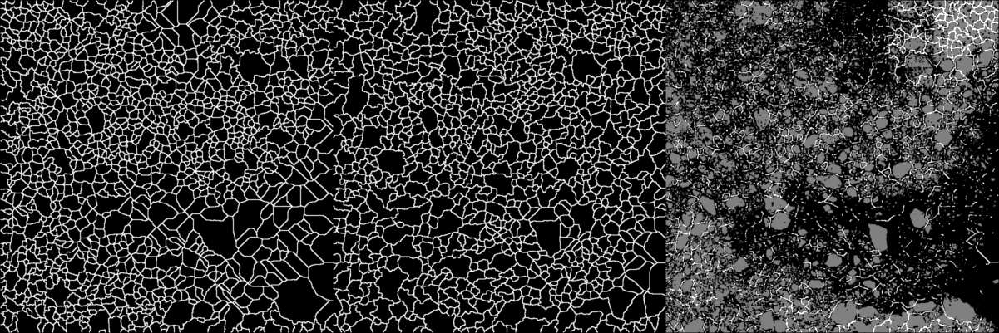

In [111]:
Images.mosaicview(Gray.(Images.isboundary(lmap) .> 0), Gray.(Images.isboundary(lmap2) .> 0),
    Gray.((Images.isboundary(lmap2) .> 0) .&& (Images.isboundary(lmap) .> 0)).+ 0.5 .* Gray.(test_idea .> 0.5),
    nrow=1)

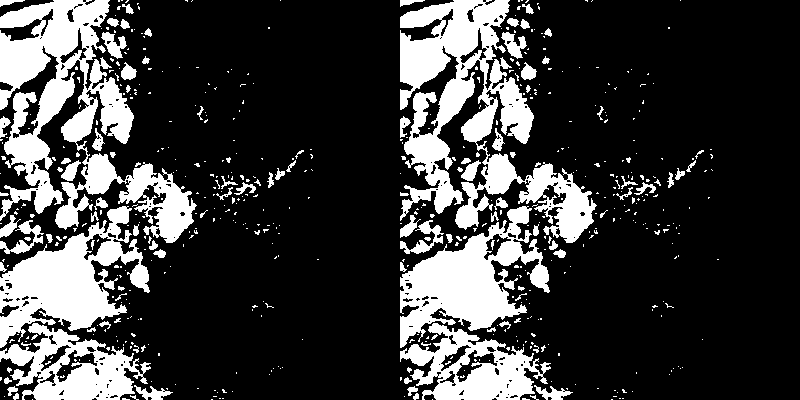

In [1040]:
Images.mosaicview(Gray.(prelim_icemask), Gray.(im1), nrow=1)

In [1041]:
outlines = man_labels .- Images.erode(man_labels);

Top left: Morphological residue, Top right: Preliminary Ice Mask
Bottom left: k-means result, Bottom right: watershed1 result

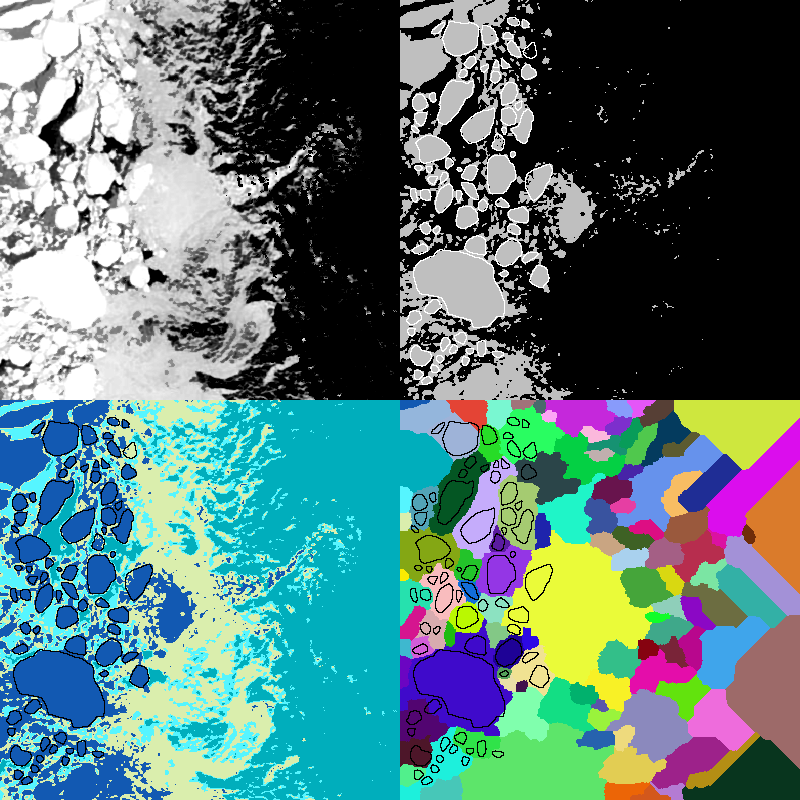

In [1042]:
print("Top left: Morphological residue, Top right: Preliminary Ice Mask\n")
print("Bottom left: k-means result, Bottom right: watershed1 result")
Images.mosaicview(morphed_image, view_seg_random(fc_segments_k4).* (1 .- outlines), 0.75 .* Gray.(prelim_icemask) .+ outlines,
    view_seg_random(lmap_seg2) .* (1 .- outlines), nrow=2)

The default watershed1 function does not work well on this image, at least. The regions are fairly random, and don't separate the bright colors well. 

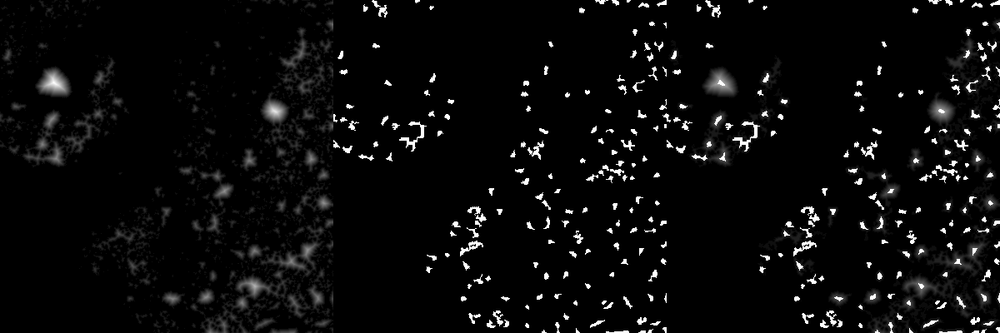

In [623]:
seg2[seg2 .< -23] .= -23
_dist2 = Gray.(-seg2 ./ maximum(abs.(seg2)))
Images.mosaicview(_dist, Gray.(mask2), _dist2, nrow=1)

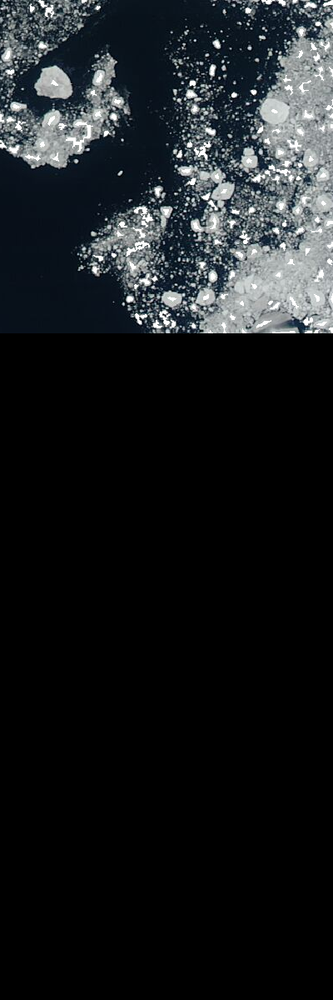

In [625]:
Images.mosaicview(tc_image + Gray.(mask2), nrow=3)

# Canny edge detection

In [626]:
using ImageEdgeDetection
img = copy(morphed_image)
img_edges₁ = detect_edges(img, Canny(spatial_scale = 1))
img_edges₂ = detect_edges(img, Canny(spatial_scale = 2))
img_edges₃ = detect_edges(img, Canny(spatial_scale = 3))
nothing

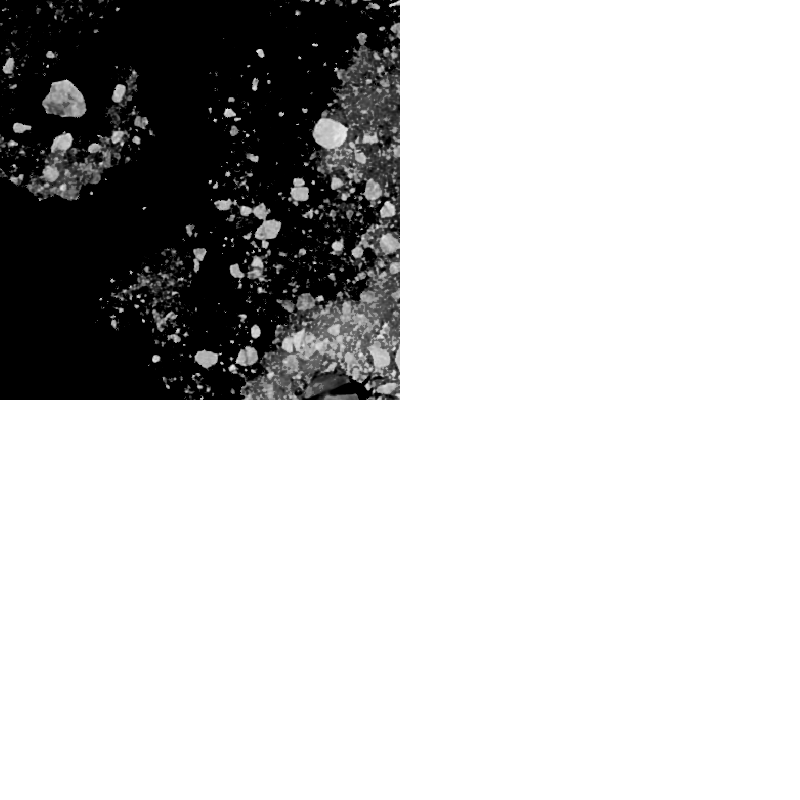

In [628]:
Images.mosaicview(img, img_edges₁, img_edges₂, img_edges₃; nrow = 2)

In [629]:
?IceFloeTracker.imbinarize

!!! warning
    The following bindings may be internal; they may change or be removed in future versions:

      * `IceFloeTracker.imbinarize`


No documentation found for private symbol.

`IceFloeTracker.imbinarize` is a `Function`.

```
# 1 method for generic function "imbinarize" from IceFloeTracker:
 [1] imbinarize(img)
     @ ~/.julia/packages/IceFloeTracker/0WFKI/src/normalization.jl:182
```
